# EDA

"In this competition, Kagglers are challenged to generate a series of **short-term signals from the book and trade data of a fixed 10-minute window to predict the realized volatility of the next 10-minute window**. The target, which is given in train/test.csv, can be linked with the raw order book/trade data by the same time_id and stock_id. There is no overlap between the feature and target window."

In [2]:
import pyarrow.parquet as pq
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# ML
from sklearn.metrics import r2_score

## 1. Understand the Variables

### 1.1 Data Index

**book_[train/test].parquet** has order book data on buy/sell orders entered into the market. The most 2 competitive prices are shared.

- `stock_id` - ID code for the stock. Not all stock IDs exist in every time bucket. We want to check for missing values.

- `time_id` - ID code for the time bucket. Time IDs are not necessarily sequential. This marks **which window**.

- `seconds_in_bucket` - Number of seconds from the start of the bucket, always starting from 0. 
  - In this data, each bucket has the same duration (~10 min); each bucket is identified by a time_id. This is **how many seconds have passed since the start of the current bucket**.

- `bid_price[1/2]` - Normalized prices of the most / second most competitive buy level. Same for `ask_price[1/2]`

- `bid_size[1/2]` - Number of shares on the most / second most competitive buy level. Same for `ask_size[1/2]`


**trade_[train/test].parquet** contains data on trades that actually executed. This is usually more sparse than the order book.

- `seconds_in_bucket` - trade data is more sparse, this field is not necessarily starting from 0.

- `price` - average price of executed transactions happening in one second. Prices have been normalized and the averages has been weighted by the number of shares traded in each transaction. 

- `size` - the sum number of shares traded.

- `order_count` - the number of unique trade orders taking place.

**train.csv** is the ground truth values for the training set.

- `target` - the realized volatility computed over the 10 minute window following the feature data under the same stock/time_id. No overlap between feature and target data.



We want to predict the target (volatility) for a pair of 'stock_id'-'time_id'.

### 1.2 What is the target?

This is a competition that predict stock's future realized volatility, which is essential for MM's hedging strategy.

**target** = the realized volatility of a stock over the next interval

More precisely, it's definied as:
![Screenshot 2026-01-05 at 2.24.36 PM.png](<attachment:Screenshot 2026-01-05 at 2.24.36 PM.png>)
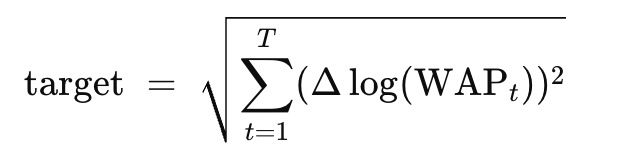

where: 

- WAP = weighted average price from the order book
- The sum runs over a fixed future time window

### 1.3 How does it vary?

In [68]:
train = pd.read_csv('../input/train.csv')  
train.head()

,stock_id,time_id,target
0,0,5,0.004136
1,0,11,0.001445
2,0,16,0.002168
3,0,31,0.002195
4,0,62,0.001747


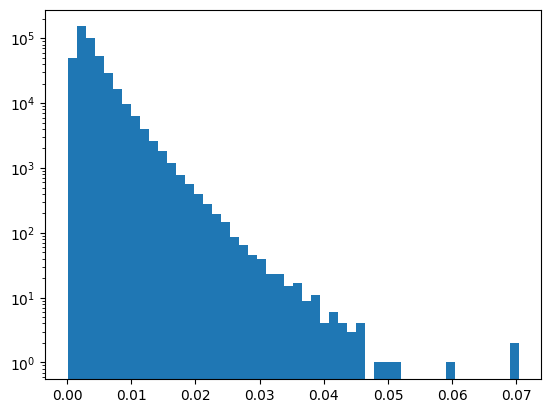

In [55]:
train['target'].describe()
plt.hist(train['target'], bins=50)
plt.yscale('log')

Target is right-skewed and large errors matter proportionally, hence RMSPE makes sense as a measurement.

Text(0.5, 0, 'Stock ID')

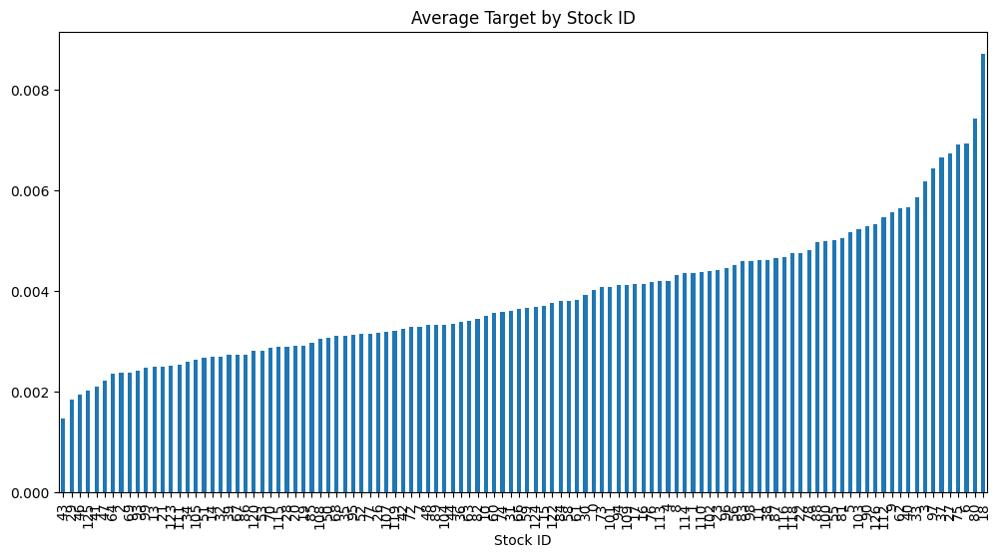

In [56]:
train.groupby('stock_id')['target'].mean().sort_values().plot(kind='bar', figsize=(12,6))
plt.title('Average Target by Stock ID')
plt.xlabel('Stock ID')

Some stocks like 'stock 18' are consistently more volatile. We need to put stock conditioning for this prediction.

Text(0.5, 0, 'Time ID')

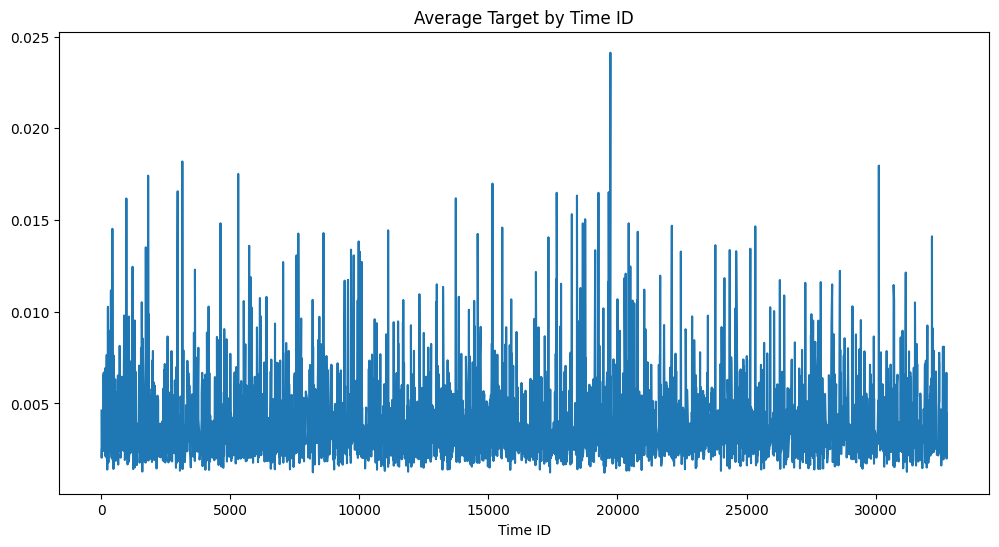

In [57]:
train.groupby('time_id')['target'].mean().plot(figsize=(12,6))
plt.title('Average Target by Time ID')
plt.xlabel('Time ID')

Volatility clusters in time, and it's mostly autocorrelated. High volatility tends to follow high volatility, while low tends to follow the previous low. The peak volatility occurs around $time\_id = 20,000$.

In [50]:
test = pd.read_csv('../input/test.csv')  
test.head()

,stock_id,time_id,row_id
0,0,4,0-4
1,0,32,0-32
2,0,34,0-34


row_id = stock_id + '-' + time_id

But this information is not particularly helpful, let's take a look at the parquet files.

### 1.4 Parquet Files Overview

In [72]:
PATH_T = '../input/trade_train.parquet/'
PATH_B = '../input/book_train.parquet/'
PATH_TT = '../input/trade_test.parquet/stock_id=0'
PATH_BT = '../input/book_test.parquet/stock_id=0'


In [73]:
book_testpeek = pd.read_parquet(PATH_BT)
book_testpeek.head()

,time_id,seconds_in_bucket,bid_price1,ask_price1,bid_price2,ask_price2,bid_size1,ask_size1,bid_size2,ask_size2
0,4,0,1.000049,1.000590,0.999656,1.000639,91,100,100,24
1,4,1,1.000049,1.000590,0.999656,1.000639,91,100,100,20
2,4,5,1.000049,1.000639,0.999656,1.000885,290,20,101,15


In [74]:
trade_testpeek = pd.read_parquet(PATH_TT)
trade_testpeek.head()

,time_id,seconds_in_bucket,price,size,order_count
0,4,7,1.000344,1,1
1,4,24,1.000049,100,7
2,4,27,1.000059,100,3


In [75]:
filter = [('stock_id', '>', 95)]

In [76]:
print(filter)

[('stock_id', '>', 95)]


#### Trades

In [77]:
#%%time
dataset = pq.ParquetDataset(PATH_T, filters=filter)  #changed filters=filter to filters=filter to NONE
table = dataset.read()
trades = table.to_pandas()
trades['stock_id'] = trades['stock_id'].astype(np.int8)
trades.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9061230 entries, 0 to 9061229
Data columns (total 6 columns):
 #   Column             Dtype  
---  ------             -----  
 0   time_id            int16  
 1   seconds_in_bucket  int16  
 2   price              float32
 3   size               int32  
 4   order_count        int16  
 5   stock_id           int8   
dtypes: float32(1), int16(3), int32(1), int8(1)
memory usage: 129.6 MB


In [14]:
trades.columns

Index(['time_id', 'seconds_in_bucket', 'price', 'size', 'order_count',
       'stock_id'],
      dtype='object')

#### Order Books

In [15]:
%%time
dataset = pq.ParquetDataset(PATH_B, filters = filter)  #changed filters=filter to filters=filter to NONE
books = dataset.read()
books = books.to_pandas()  # I overwrite the pyarrow table object here to save memory
books['stock_id'] = books['stock_id'].astype(np.int8)
books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41686608 entries, 0 to 41686607
Data columns (total 11 columns):
 #   Column             Dtype  
---  ------             -----  
 0   time_id            int16  
 1   seconds_in_bucket  int16  
 2   bid_price1         float32
 3   ask_price1         float32
 4   bid_price2         float32
 5   ask_price2         float32
 6   bid_size1          int32  
 7   ask_size1          int32  
 8   bid_size2          int32  
 9   ask_size2          int32  
 10  stock_id           int8   
dtypes: float32(4), int16(2), int32(4), int8(1)
memory usage: 1.4 GB
CPU times: total: 18.1 s
Wall time: 4.87 s


In [78]:
print(f'Found {books.time_id.nunique()} unique time ids in books.')
print(f'Found {books.stock_id.nunique()} unique stock ids in books.')

Found 3830 unique time ids in books.
Found 112 unique stock ids in books.


## 2. Characteristics and Analysis

### 2.1 Analysis by Stock

In [79]:
train

,stock_id,time_id,target
0,0,5,0.004136
1,0,11,0.001445
2,0,16,0.002168
3,0,31,0.002195
4,0,62,0.001747
...,...,...,...
428927,126,32751,0.003461
428928,126,32753,0.003113
428929,126,32758,0.004070
428930,126,32763,0.003357


In [80]:
for col in train.columns:
    print(col, ":", len(train[col].unique()))

stock_id : 112
time_id : 3830
target : 414287


In [83]:
stock = train.groupby('stock_id')['target'].agg(
    ['mean', 'median', 'std', 'min', 'max', 'count', 'sum']
).reset_index()
stock

,stock_id,mean,median,std,min,max,count,sum
0,0,0.004028,0.003180,0.002855,0.000594,0.036311,3830,15.429071
1,1,0.004362,0.003719,0.002433,0.000885,0.020951,3830,16.704962
2,2,0.002385,0.001748,0.002339,0.000394,0.024848,3830,9.133223
3,3,0.006182,0.005422,0.003201,0.000746,0.038606,3830,23.675414
4,4,0.004197,0.003397,0.002879,0.000810,0.025648,3830,16.073408
...,...,...,...,...,...,...,...,...
107,122,0.003762,0.003176,0.002300,0.000861,0.022916,3830,14.407997
108,123,0.002506,0.001967,0.001816,0.000453,0.017907,3830,9.599594
109,124,0.003691,0.003143,0.001953,0.001064,0.019407,3830,14.135579
110,125,0.002016,0.001575,0.001703,0.000344,0.024615,3830,7.719409


mean target value= 0.0038805243039130312


Text(0, 0.5, 'Frequency')

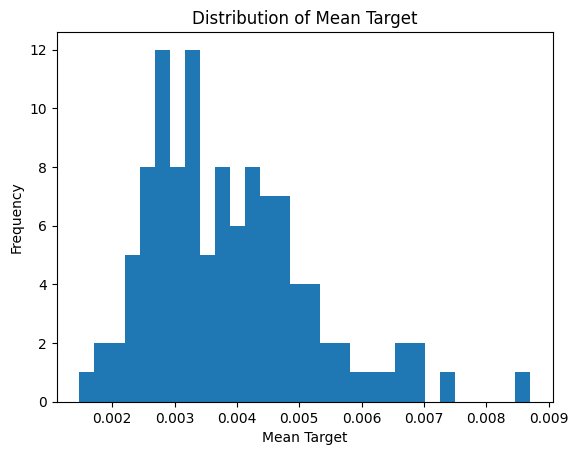

In [87]:
print('mean target value=', stock['mean'].mean())
plt.hist(stock['mean'], bins=30)
plt.title('Distribution of Mean Target')
plt.xlabel('Mean Target')
plt.ylabel('Frequency')

The average volatility is 0.003880.

sum value= 14.860998424142858


Text(0, 0.5, 'Frequency')

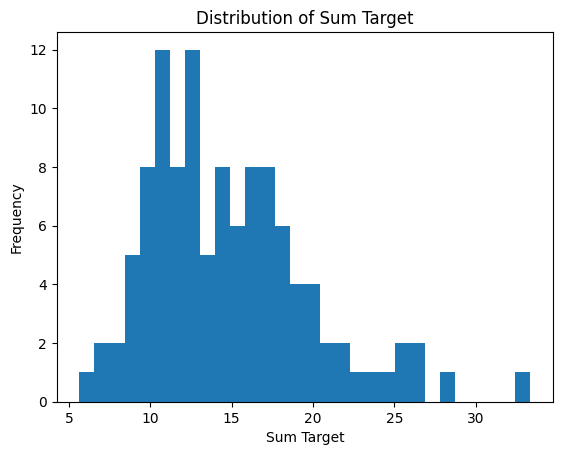

In [88]:
print('sum value=', stock['sum'].mean())
plt.hist(stock['sum'], bins=30)
plt.title('Distribution of Sum Target')
plt.xlabel('Sum Target')
plt.ylabel('Frequency')

The total volatility (sum of the volatility) for each stock has a mean of 14.8. 

# Static functions

### WAP (Weighted average price)

In [17]:
def append_wap1(df):
    df['wap1'] = (df['bid_price1'] * df['ask_size1'] + df['ask_price1'] * df['bid_size1']) / (df['bid_size1']+ df['ask_size1'])
    return df

In [18]:
def append_wap2(df):
    df['wap2'] = (df['bid_price2'] * df['ask_size2'] + df['ask_price2'] * df['bid_size2']) / (df['bid_size2']+ df['ask_size2'])
    return df

In [19]:
books = append_wap1(books)
books = append_wap2(books)

In [40]:
def plot_wap(books_df, time_id, stock_id_arr):
    
    fig, ax = plt.subplots(len(stock_id_arr), 1, figsize=(18 , 60))
    fig.tight_layout(pad=2.0)
    i= 0
    
    for stock_id in stock_id_arr:
        mask = np.logical_and(books_df["stock_id"]==stock_id, books_df["time_id"]==time_id)
        ax2 = ax[i].twinx()
        
        sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["wap1"], ax=ax[i], color='blue')
        sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["ask_price1"], ax=ax[i], color='red')
        sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["bid_price1"], ax=ax[i], color='green')
        sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["bid_size1"] + books_df[mask]["ask_size1"], ax=ax2, color='orange')
        #sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["log_return"], ax=ax2, color='orange')
        
        ax[i].set_title(f'Stock_id: {stock_id}', loc='left', fontweight='bold')     
        ax[i].legend(['wap', 'ask_price1', 'bid_price1'], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        ax2.legend(["bid_size1 + ask_size1"], bbox_to_anchor=(1.05, 0.78), loc=2, borderaxespad=0.)
        i+=1
    plt.show()

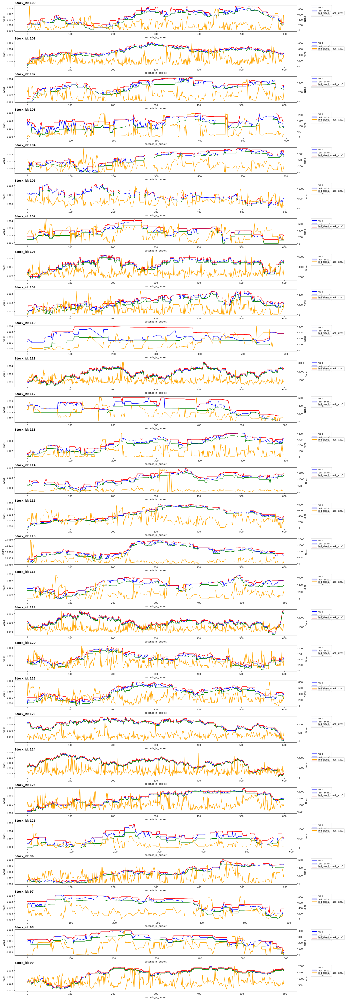

In [41]:
stock_id_arr = books["stock_id"].unique()
plot_wap(books, 5, stock_id_arr)

The formula of WAP can be written as below, which takes the top level price and volume information into account:

$$ WAP = \frac{BidPrice_{1}*AskSize_{1} + AskPrice_{1}*BidSize_{1}}{BidSize_{1} + AskSize_{1}} $$

As you can see, if two books have both bid and ask offers on the same price level respectively, the one with more offers in place will generate a lower stock valuation, as there are more intended seller in the book, and more seller implies a fact of more supply on the market resulting in a lower stock valuation.

## Wap Balance

In [42]:
def wap_balance(books_df):
    books_df['wap_balance'] = abs(books_df['wap1'] - books_df['wap2'])
    return books_df

In [43]:
books = wap_balance(books)

In [48]:
def plot_wap_balance(books_df, time_id, stock_id_arr):
    
    fig, ax = plt.subplots(len(stock_id_arr), 1, figsize=(18 , 60))
    fig.tight_layout(pad=2.0)
    i= 0
    
    for stock_id in stock_id_arr:
        mask = np.logical_and(books_df["stock_id"]==stock_id, books_df["time_id"]==time_id)
        ax2 = ax[i].twinx()
        
        sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["wap1"], ax=ax[i], color='blue')
        sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["wap2"], ax=ax[i], color='green')
        
        sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["wap_balance"], ax=ax2, color='orange')
        
        ax[i].set_title(f'Stock_id: {stock_id}', loc='left', fontweight='bold')     
        ax[i].legend(['wap1', 'wap2'], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        ax2.legend(["wap_balance"], bbox_to_anchor=(1.05, 0.78), loc=2, borderaxespad=0.)
        i+=1
    plt.show()

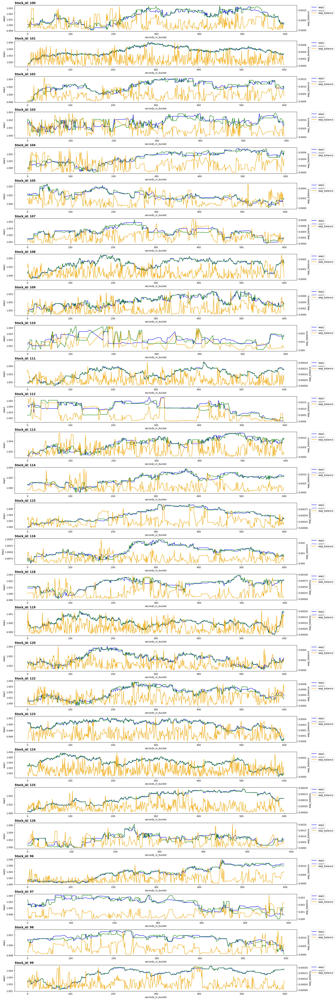

In [49]:
stock_id_arr = books["stock_id"].unique()
plot_wap_balance(books, 5, stock_id_arr)

### Logarithm retrun

Returns are widely used in finance, however **log returns** are preferred whenever some mathematical modelling is required. Calling $S_t$ the price of the stock $S$ at time $t$, we can define the log return between $t_1$ and $t_2$ as:
$$
r_{t_1, t_2} = \log \left( \frac{S_{t_2}}{S_{t_1}} \right)
$$
Usually, we look at log returns over fixed time intervals, so with 10-minute log return we mean $r_t = r_{t - 10 min, t}$.

Log returns present several advantages, for example:
* Normalize data to have a better visualization and are are preferred whenever some mathematical modelling is required

To compute the log return, we can simply take **the logarithm of the ratio** between two consecutive **WAP**. The first row will have an empty return as the previous book update is unknown, **therefore the empty return data point will be dropped. We have data from "seconds_in_bucket == 1" to higher.**

In [50]:
def log_return(list_stock_prices):
    return np.log(list_stock_prices).diff()

In [52]:
# books.loc[:,'log_return'] = log_return(books['wap'])
# books = books[~books['log_return'].isnull()]
# # apply log_return function and use data to create new row
books.loc[:,'log_return1'] = books.groupby(['stock_id','time_id'])['wap1'].transform(log_return)
books = books[~books['log_return1'].isnull()]
books.loc[:,'log_return2'] = books.groupby(['stock_id','time_id'])['wap2'].transform(log_return)
books = books[~books['log_return2'].isnull()]

C:\Users\Ying Zhu\AppData\Local\Temp\ipykernel_45164\3431614253.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  books.loc[:,'log_return2'] = books.groupby(['stock_id','time_id'])['wap2'].transform(log_return)


In [59]:
def wap_vs_logretrun(books_df, time_id, stock_id_arr):
    
    fig, ax = plt.subplots(len(stock_id_arr), 1, figsize=(18 , 60))
    fig.tight_layout(pad=2.0)
    i= 0
    
    for stock_id in stock_id_arr:
        mask = np.logical_and(books_df["stock_id"]==stock_id, books_df["time_id"]==time_id)
        ax2 = ax[i].twinx()
        
        sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["wap1"], ax=ax[i], color='blue')
        sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["log_return1"], ax=ax2, color='orange')
        
#         sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["wap2"], ax=ax[i], color='green')
#         sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["log_return2"], ax=ax2, color='purple')
        
        
        ax[i].set_title(f'Stock_id: {stock_id}', loc='left', fontweight='bold')     
        ax[i].legend(['wap1'], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        ax2.legend(["log_return1"], bbox_to_anchor=(1.05, 0.9), loc=2, borderaxespad=0.)
        i+=1
    plt.show()

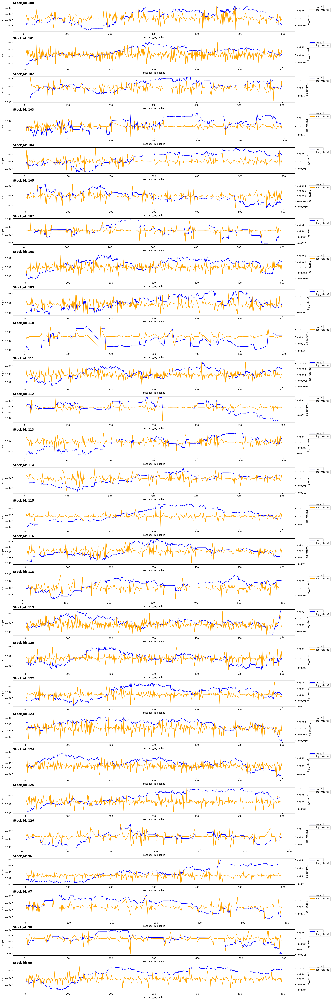

In [60]:
stock_id_arr = books["stock_id"].unique()
wap_vs_logretrun(books, 5, stock_id_arr)

# Realized volatility for stocks in features bucket
When we trade options, a valuable input to our models is the standard deviation of the stock log returns. The standard deviation will be different for log returns computed over longer or shorter intervals, for this reason it is usually normalized to a 1-year period and the annualized standard deviation is called **volatility**. 

In this competition, you will be given 10 minutes of book data and we ask you to predict what the volatility will be in the following 10 minutes. Volatility will be measured as follows:

We will compute the log returns over all consecutive book updates and we define the **realized volatility, $\sigma$,** as the squared root of the sum of squared log returns.
$$
\sigma = \sqrt{\sum_{t}r_{t-1, t}^2}
$$
Where we use **WAP** as price of the stock to compute log returns.

We are not annualizing the volatility and we are assuming that log returns have 0 mean.

In this competition, our target is to predict short-term realized volatility. Although the order book and trade data for the target cannot be shared, we can still present the realized volatility calculation using the feature data we provided. 

As realized volatility is a statistical measure of price changes on a given stock, to calculate the price change we first need to have a stock valuation at the fixed interval (1 second). We will use weighted averaged price, or WAP, of the order book data we provided.

In [61]:
def realized_volatility(books_df, time_id, stock_id_arr):
    for stock_id in stock_id_arr:
        mask = np.logical_and(books_df["stock_id"]==stock_id, books_df["time_id"]==time_id)
        
        realized_vol1 = np.sqrt(np.sum(books_df[mask]['log_return1']**2))
        realized_vol2 = np.sqrt(np.sum(books_df[mask]['log_return2']**2))
        
        print(f'Realized volatility1 for stock_id {stock_id} on time_id {time_id} is {realized_vol1}')
        print(f'Realized volatility2 for stock_id {stock_id} on time_id {time_id} is {realized_vol2}')

In [62]:
stock_id_arr = books["stock_id"].unique()
realized_volatility(books, 5, stock_id_arr)

Realized volatility1 for stock_id 100 on time_id 5 is 0.004812784492969513
Realized volatility2 for stock_id 100 on time_id 5 is 0.007185525726526976
Realized volatility1 for stock_id 101 on time_id 5 is 0.005350112449377775
Realized volatility2 for stock_id 101 on time_id 5 is 0.006173650734126568
Realized volatility1 for stock_id 102 on time_id 5 is 0.006934612523764372
Realized volatility2 for stock_id 102 on time_id 5 is 0.008732319809496403
Realized volatility1 for stock_id 103 on time_id 5 is 0.005804490298032761
Realized volatility2 for stock_id 103 on time_id 5 is 0.008370631374418736
Realized volatility1 for stock_id 104 on time_id 5 is 0.0036284697707742453
Realized volatility2 for stock_id 104 on time_id 5 is 0.004682063590735197
Realized volatility1 for stock_id 105 on time_id 5 is 0.0028895793948322535
Realized volatility2 for stock_id 105 on time_id 5 is 0.003520937403663993
Realized volatility1 for stock_id 107 on time_id 5 is 0.00382023211568594
Realized volatility2 for

In [72]:
def log_return_hist(books_df, time_id, stock_id_arr):
    fig, ax = plt.subplots(len(stock_id_arr), 1, figsize=(20 , 60))
    fig.tight_layout(pad=4.0)
    
    i= 0
    for stock_id in stock_id_arr:
        mask = np.logical_and(books_df["stock_id"]==stock_id, books_df["time_id"]==time_id)
        realized_vol1 = np.sqrt(np.sum(books_df[mask]['log_return1']**2))
        
        sns.histplot(data=books[mask]["log_return1"], ax= ax[i])
        _std = np.std(books[mask]["log_return1"])
        ax[i].set_title(f'Realized volatility1 for stock_id {stock_id} on time_id {time_id} is {round(realized_vol1, 5)}, teh std is: {round(_std, 5)}',
                        loc='left', fontweight='bold')     
        i+=1
    
    plt.show()

# Inspect the Distributions of Variables

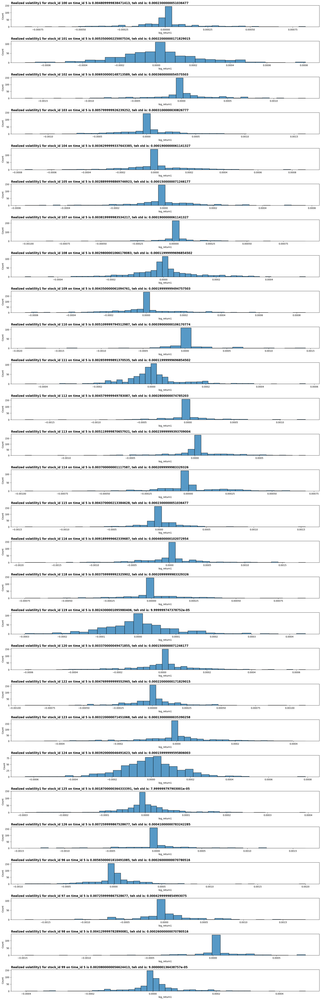

In [73]:
stock_id_arr = books["stock_id"].unique()
log_return_hist(books, 5, stock_id_arr)

1. **If the Standard deviation is lower, the realized volatility is lower.**
2. **If the Standard deviation is higher, the realized voaltility is higher.**

## 5. Checking for Missing Data

# Trades

In [75]:
trades.loc[:,'log_return'] = trades.groupby(['stock_id','time_id'])['price'].transform(log_return)
trades = trades[~trades['log_return'].isnull()]

In [76]:
trades.loc[:,'amount'] = trades['price']*trades['size']

C:\Users\Ying Zhu\AppData\Local\Temp\ipykernel_45164\733443753.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trades.loc[:,'amount'] = trades['price']*trades['size']


In [77]:
trades

,time_id,seconds_in_bucket,price,size,order_count,stock_id,log_return,amount
1,5,6,1.000239,201,4,100,0.000137,201.048111
2,5,9,1.000444,1,1,100,0.000205,1.000444
3,5,28,1.000376,12,3,100,-0.000068,12.004513
4,5,30,1.000444,3,1,100,0.000068,3.001333
5,5,31,1.000852,155,7,100,0.000408,155.132126
...,...,...,...,...,...,...,...,...
9061225,32767,570,0.999932,100,1,99,0.000135,99.993233
9061226,32767,575,0.999932,100,1,99,0.000000,99.993233
9061227,32767,579,0.999797,300,3,99,-0.000135,299.939117
9061228,32767,584,0.999854,172,2,99,0.000057,171.974838


In [78]:
def amount_vs_logretrun(books_df, time_id, stock_id_arr):
    
    fig, ax = plt.subplots(len(stock_id_arr), 1, figsize=(18 , 60))
    fig.tight_layout(pad=2.0)
    i= 0
    
    for stock_id in stock_id_arr:
        mask = np.logical_and(books_df["stock_id"]==stock_id, books_df["time_id"]==time_id)
        ax2 = ax[i].twinx()
        
        sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["amount"], ax=ax[i], color='blue')
        sns.lineplot(x=books_df[mask]["seconds_in_bucket"], y=books_df[mask]["log_return"], ax=ax2, color='orange')
        
        ax[i].set_title(f'Stock_id: {stock_id}', loc='left', fontweight='bold')     
        ax[i].legend(['amount'], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        ax2.legend(["log_return1"], bbox_to_anchor=(1.05, 0.9), loc=2, borderaxespad=0.)
        i+=1
    plt.show()

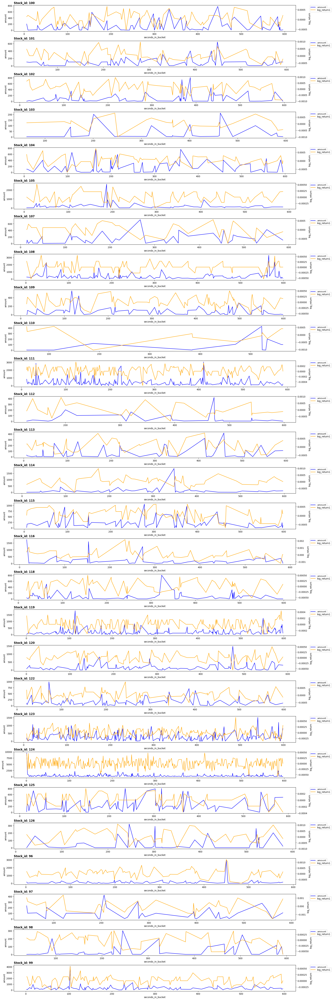

In [79]:
trades_id_arr = trades["stock_id"].unique()
amount_vs_logretrun(trades, 5, stock_id_arr)

In [80]:
def tendency(price, vol):    
    df_diff = np.diff(price)
    val = (df_diff/price[1:])*100
    power = np.sum(val*vol[1:])
    return(power)

In [81]:
mask = np.logical_and(trades["stock_id"]==98, trades["time_id"]==5)
tendency(trades[mask]["price"].values, trades[mask]['size'].values)

np.float64(-27.686525619064923)